In [1]:
import os
import json
import sys
import numpy as np
import struct
import matplotlib.pyplot as plt
#%matplotlib inline
import cv2
from IPython.display import display as ipy_display

In [2]:
## dictionary with key as the image source, value is the location of that datasets images
source_and_location_image_datasets = {
    'flickr30k' : r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/flickr30k_images/flickr30k_images/',
    'coco_val_2017' : r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/',
    'coco_test_2017' : r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/',
    'coco_train_2017' : r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/'
    }

## Specify the input file

In [3]:
IP_FILE_DIR = r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/ReportNPpt/Run_Files/th_ip_1/StyGen/'
IP_FILE_NAME = r'op_sty_gen_th1_len300_temp0.95_topk0_nsamp1.txt'

In [4]:
ipFile_StyGenResults = IP_FILE_DIR + IP_FILE_NAME
os.path.exists(ipFile_StyGenResults)

True

In [5]:
## reload the data structure of Story Generator logic output
with open(ipFile_StyGenResults, "r") as f:
    sty_gen_inference_module_results = json.load(f)

In [6]:
sty_gen_inference_module_results

[{'key_elements': ['book', 'person'],
  'selected_images_no_attn': [['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000467509.jpg',
    'woman is sitting on couch with her cell phone'],
   ['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000415683.jpg',
    'woman is cutting cake with knife']],
  'selected_images_with_attn': [['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000467509.jpg',
    'a man sitting on a couch with a laptop'],
   ['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000415683.jpg',
    'a man is sitting at a book on a book']]},
 {'key_elements': ['tvmonitor', 'person'],
  'selected_images_no_attn': [['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg',
    'man and woman playing

In [7]:
#def display_an_image(_img_path):
#    img = cv2.imread(_img_path, cv2.IMREAD_COLOR)
#    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # cv2.COLOR_RGB2BGR  cv2.COLOR_BGR2RGB
#    plt.figure(figsize=(10,10))
#    plt.imshow(img)

def display_image(_img_path):
    img = cv2.imread(_img_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # cv2.COLOR_RGB2BGR  cv2.COLOR_BGR2RGB
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.show()

comb_no_attn_stories   = sty_gen_inference_module_results[-2]['combined_no_attn_sent_stories']
comb_with_attn_stories = sty_gen_inference_module_results[-1]['combined_with_attn_sent_stories']

print(f"comb_no_attn_stories =\n{comb_no_attn_stories}\n\ncomb_with_attn_stories =\n{comb_with_attn_stories}")

comb_no_attn_stories =
[[['/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000467509.jpg', '/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg'], "Woman is sitting on couch with her cell phone. Man and woman playing video game together. Comes over to her room -LRB- supine girl -RRB-. Man 's wife has her own eyes open .' Then she told her fortune to the ALLTRUACNESS. With children always being a treasure, they found out that Ezekiel had been there -- and then, having never seen him since the distant years went by, they waited. The good fortune was told to the lion and she took it from him and carried it back in a row. ` Really, ' said she, ` do not expect to be able to find Ezekiel, because you are not even photographed !' They stared at each other in astonishment for a moment, till at last its crooked line grew sharp again. ` Good morning, ' she said hastily, ` and d



=================== COMBINED NO ATTN STORIES ===================
=================== COMBINED NO ATTN STORIES ===================
=================== COMBINED NO ATTN STORIES ===================


Total combined NO ATTN stories = 6



************* Story 1 of 6 *************

Image 1 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000467509.jpg


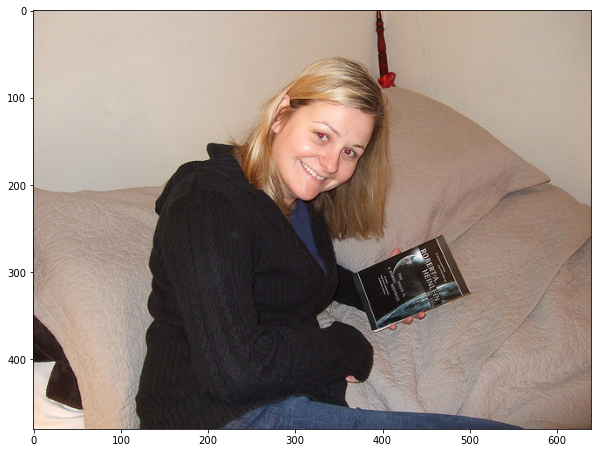

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg


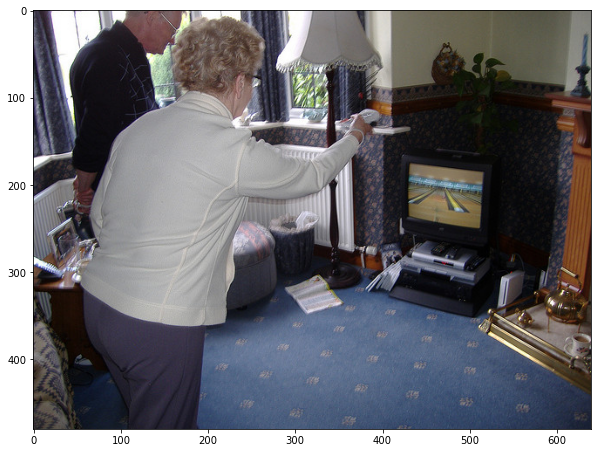


Generated story =
Woman is sitting on couch with her cell phone. Man and woman playing video game together. Comes over to her room -LRB- supine girl -RRB-. Man 's wife has her own eyes open .' Then she told her fortune to the ALLTRUACNESS. With children always being a treasure, they found out that Ezekiel had been there -- and then, having never seen him since the distant years went by, they waited. The good fortune was told to the lion and she took it from him and carried it back in a row. ` Really, ' said she, ` do not expect to be able to find Ezekiel, because you are not even photographed !' They stared at each other in astonishment for a moment, till at last its crooked line grew sharp again. ` Good morning, ' she said hastily, ` and do not talk nonsense : Elder Peter is fine as cannon, but if not, he is neither a Bishop, nor a minister. He was not a Minister, but had the power to do and say anything he saw fit. I must ask his name. He lives in a far country -- United States, I s

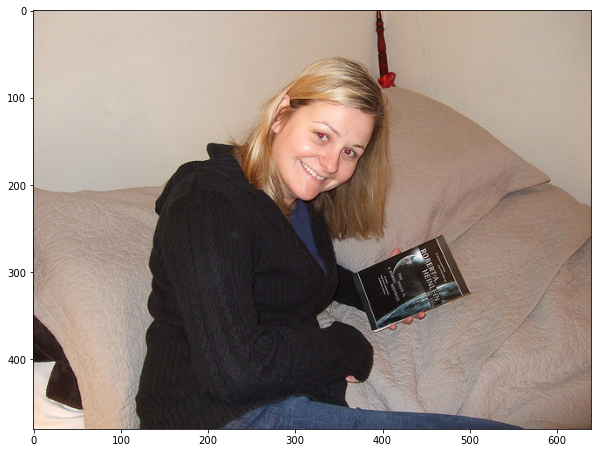

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000438521.jpg


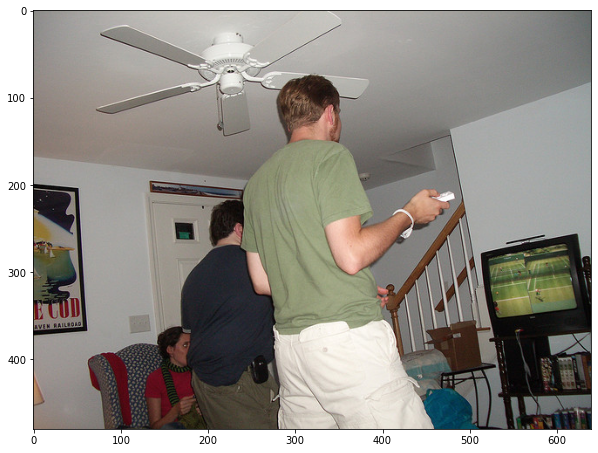


Generated story =
Woman is sitting on couch with her cell phone. Man and woman are playing video game. He seems very angry and clever and bent on breaking out! The door shuts right away. Hasty. Then it is opened firmmore, the door steps in the arches you people say, and a collar of green buttercups is put around. A mighty big glove ; and, real I had a wish of dressing the merry jig up, with all those foseden curls that go up your back, free down and snaps on it by which you sit, fed. A pretty too ! Well, I like green buttercups, '' Peggy stamped away with a determined look as she switched her hands between pans. `` I do not like them, '' Marilla said distinctly with a snap. She held one, and passed on patronizingly. `` They are good, '' she said. `` I like the whole affair, '' Marilla sternly remarked. `` Of course, the husband for our boy ! '' `` Oh, no, he is not ! '' she said softly. `` You do not believe it, Marilla? Even think gritting any more about your oar. You look as if a th

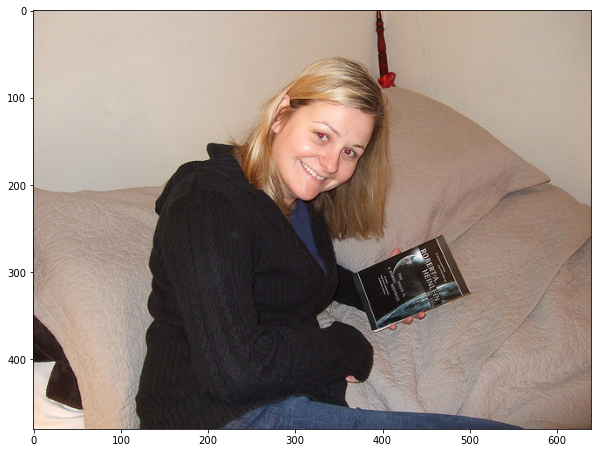

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000287296.jpg


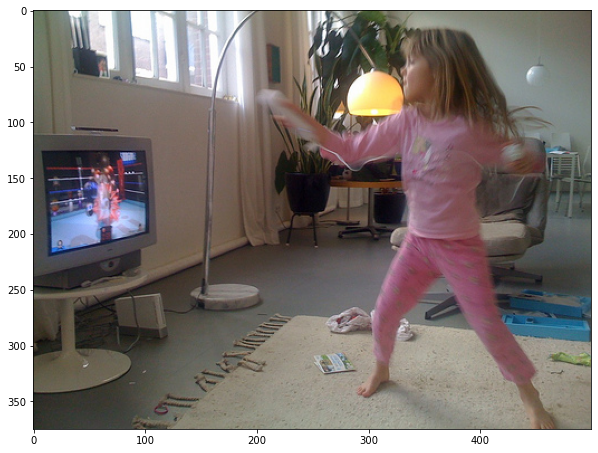


Generated story =
Woman is sitting on couch with her cell phone. Young boy standing in front of tv playing video game. A coyote to his heart 's content. Old man in the back yard. But most of all he was thinking about how big he must be, and how long he might have gotten to yesterday. How nice it feels to live in the morning. Old man was hoeing till the plants grew ; but the snow was only in glossier and sweeter. It was cold and crisp then ; but now it was snowy ; and he was small earthlier than ever. He had seen Mrs. Rose telling him he might be sceptical about that specific word of his name. He had feared to walk along the path when she mentioned Rose being in hospital. They had warned themselves that she is acquaintance with mackerel folk, and she is a favourite. My life had been in a state of being out this past Monday ; and that morning she had told him he might be an orphan there. Where to look for the people at Rose 's parlor? When the boys and girls occurred to snoop their way 

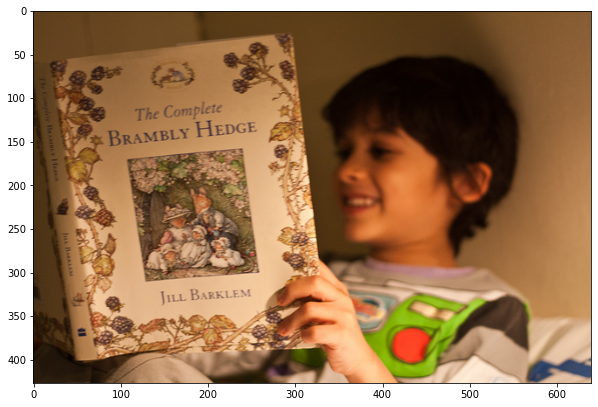

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg


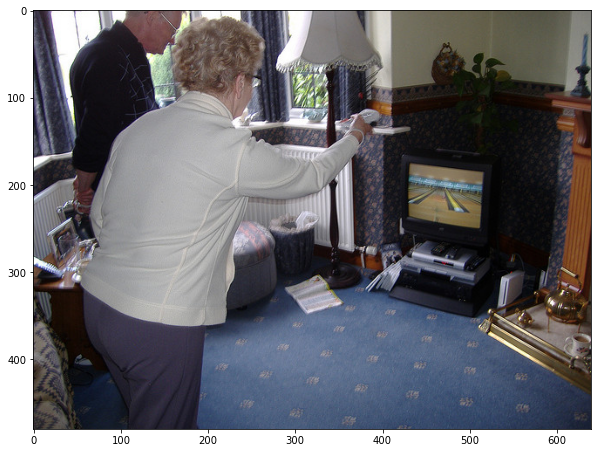


Generated story =
Woman is cutting cake with knife. Man and woman playing video game together. He looks so sad and timid . ''' `` Now, '' we went on, with no alteration of words. `` May her sheltering learning come in, as those playable games did. Great prophecy has Bess see her happy friend 's sleigh near the home-sick ; how they have seen her come with home for a spell -- and what she have seen them do with them, if they are to have the queer grace to be there, either with Father in fathering or with Mother in child-riding, playing about peace, as they have done to their friends. Is she listening, Mathers ? '' Weeks so lives fixing turn out to be more than our good one had but one David-- who, while rummaging to salvage the game, found lots of sticks among his deep bits of success. Mr. B. seemed to know what trouble was brewing in his little life, and he looked at the table with a pleasant air as he watched the clock scratch. I felt him grow red, yes, and afterwards comforted myself

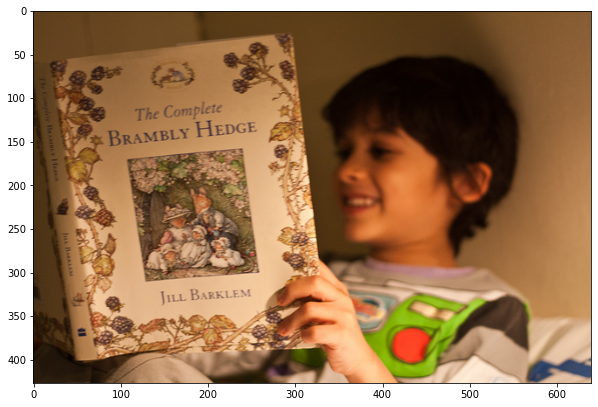

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000438521.jpg


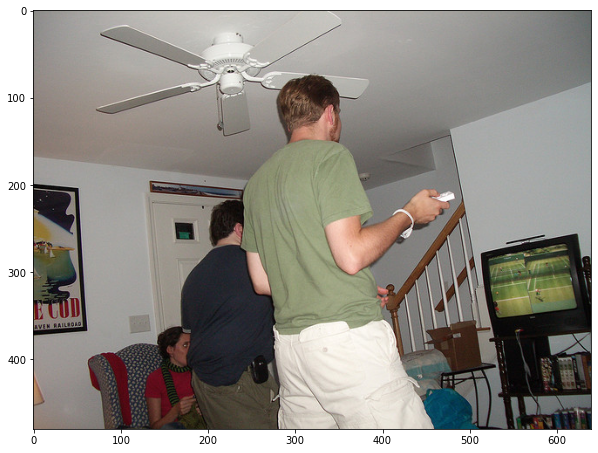


Generated story =
Woman is cutting cake with knife. Man and woman are playing video game. The village dressmaker has got a new tailor 's store at the manse. But all the other beggars are alone -- the dressmaker, the farmer, the lady . '' This was the last her mother uttered before turning and smiling at the "girls, '' Aslauga 's early capture by the rapid succession of blows ; and the truth is, she had made up her mind and had moved ` into happiness with a firm resolution to escape Dr. Jim 's attempt to take her over. Miss Ella, it was not truth or fun she had left her "guest. Suppose she were! I knew her blue eyes,-- two for a head as a face ; the solid, clear blue eyes, with her fair curls of turquoises and high brows, and the Hazelnut eyes, with all that amber color and sparkling shine. But everything could not be otherwise! There could not, not, not. The woman herself was walking aside gladly into her bleak room, watching the speaker, for she was always such a satiate subject to r

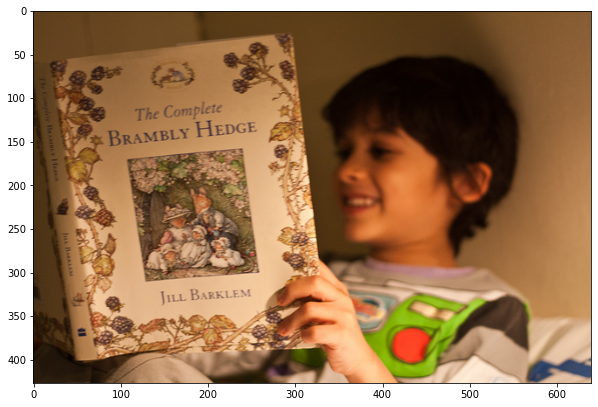

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000287296.jpg


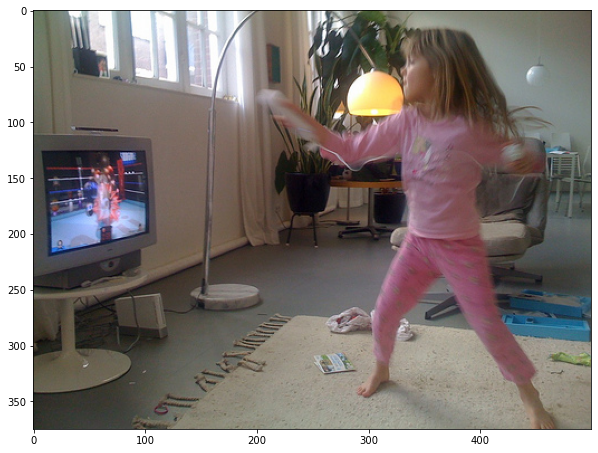


Generated story =
Woman is cutting cake with knife. Young boy standing in front of tv playing video game. I do not expect him to be very good-looking. No, sir, not at all, but I suppose it is nothing to be ashamed of, ' said Miss Wood then, sidling along to Jo and going on 'cause she now had been asleep. After a while she led a minute 's conversation with an eager shrew, who, when she thought about it, told a story about a mischievous little dog he had got to keep hidden. She told him that old people had the power to say anything they liked, just like spies, and yet she was sure he was not one. As I do not mind being called an old woman, I found it very interesting to hear her tell such a story first. It was of Mabel Wood, and she was exactly the little sister she was! She was too shy to talk, but she said to her aunt she knew as well as she went on her way that Mabel Wood was never seen by anyone. It was about Billy Williams, and when she was done, she looked as excited as ever, for 

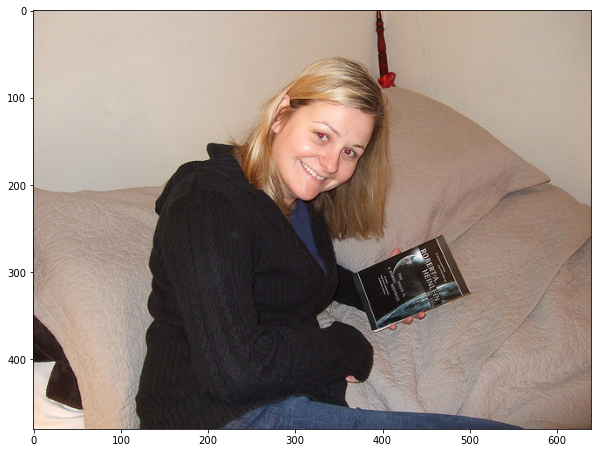

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg


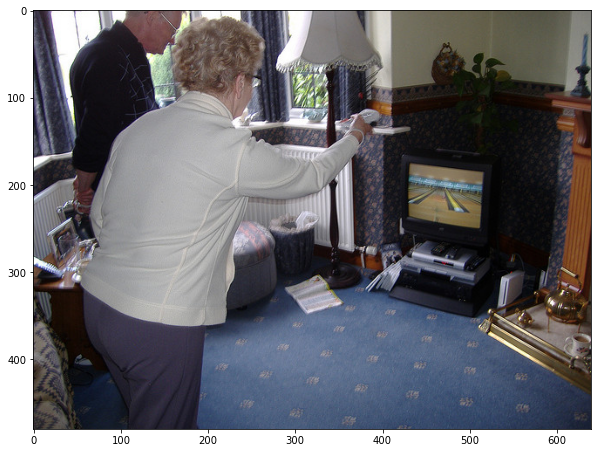


Generated story =
A man sitting on a couch with a laptop. A woman is cutting a remote and a woman. A man sitting on a bed-leg with a dear friend in it belongs to his wife, and somebody else belongs to another woman. Mrs. Wheeler, Jack Franklin, and Fritz had the day of their sweetest, and I believe Elinor was with them. Mrs. Wheeler, Jenny Holden 's ribs were tickling me once. A woman, the doctor till she gropped out her knuckles, said Uncle John was coming with the doctor first. A little boy took the weekend. Uncle John said it was due to a popular picture in the great books. But that possessed a character. I must have been in my innocence, and I watched the two families for the boutiques on the corners yard. Now, it is cruel to think of many bewhislings by days and years. A man with Miss Oliver 's purse must have been a renowned lover ; I could make an old face myself. At least, I shall remember that Adam Wheeler had drunk all day at a pub earlier in the afternoon. I may now meet a 

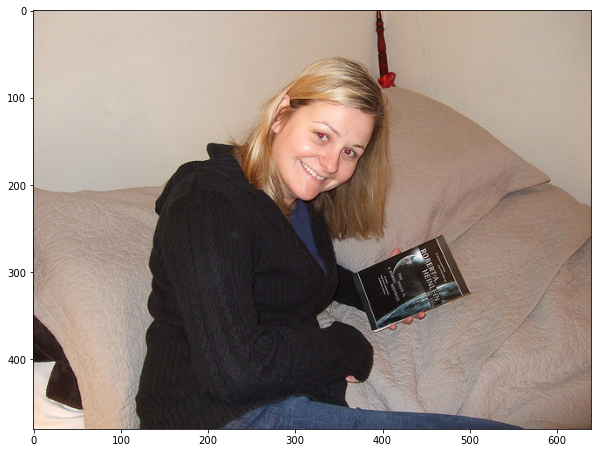

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000438521.jpg


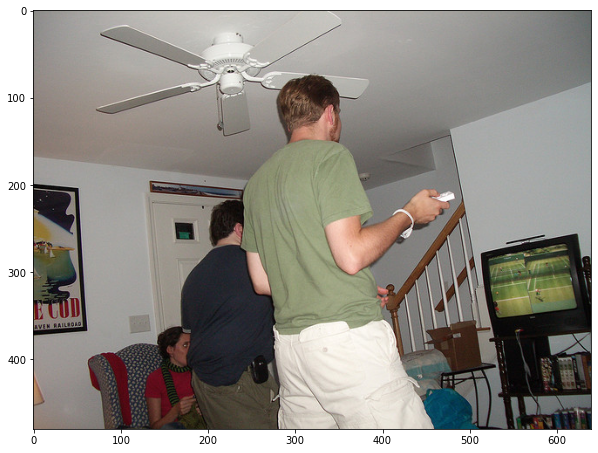


Generated story =
A man sitting on a couch with a laptop. Two men playing wii in a living room. When I went out again after dinner, Jill was standing on two legs so that her whole nine feet stood straight into the middle of my bill. She went to work a minute about me. I did not mind her phantom downstairs that day. We did not know what work lay between Jill and her room. She put on her gown and dressed herself up calmly and deliberately. Again, when she heard me going to bed, she came down to my pieds and put her forehead in my arms, then she embraced me while I flung myself a little closer to her and said as a voice came trembling from her room ahead of the line : `` I have seen everything . '' Then I must confess that she took my arm in her hands, and now she listened -- not in any way that I could judge. She had no neat curls and fur-coats. I was so scared to remind her I did not want to exploit her horses. She was an absolute wreck. Else she would not let me kiss her and run away 

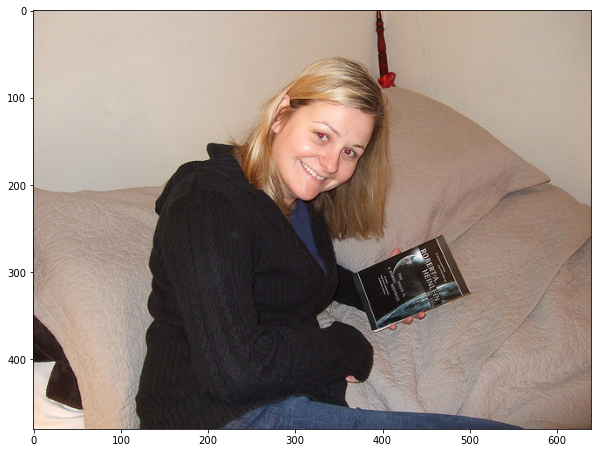

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000287296.jpg


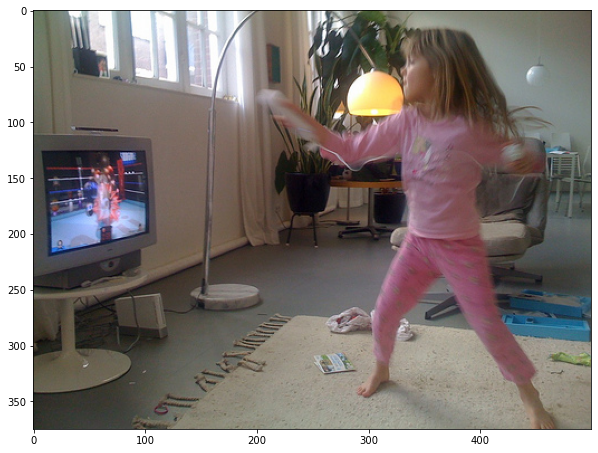


Generated story =
A man sitting on a couch with a laptop. A man playing a game with a wii remote. The only discovery was that guest had a dud, the power to do anything males could do. I should have been laughed at ; but the only curse was that I was not in love with him, as I had been ; and I had a feeling that the evil carried on his lazy shoulders that I could not help jealousy and envy in me too. All these things were a thin, bitter light, of the dark, loneliest night we could not -- Nahum 's writing could give him no drift to stay. The music was moderate and jolly ; the men 's stock music by the Chicago school and St. John 's Greek was far from being great -- only the anody had a sudden, wonderful burst of effulgence not like what I had heard in St. John 's. The Stella came, a determined, choky voice suddenly snatched a talk in short bursts. I floundered away from his feeling a moment before the end of the talk. I had no reason to doubt him but, perhaps, I am the only man in a rel

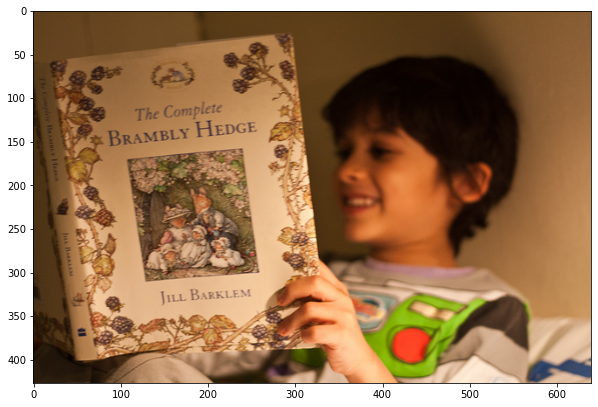

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000214645.jpg


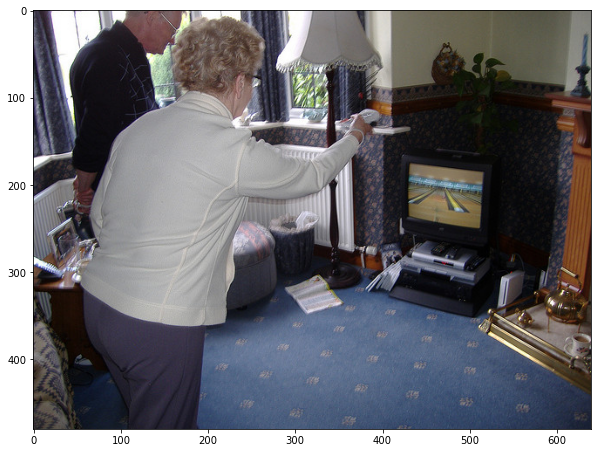


Generated story =
A man is sitting at a book on a book. A woman is cutting a remote and a woman. They insist on reading one thing and then on saying a thing in like a tone and they do. She has a sweet very sweet heart 's darling, the dreamy nature. At this quaint little world of Journal science '' -- Mrs. Shirley found it hard to refute the poetry of her old dream -- `` of dreamy beauty I was homely and yet my face was beautiful. It was all the old distance of the spirit in my slender figure, the Beauty of Nature, and the beauty of the word with its romantic appeal. Murmuring might be the very address in which I had read it to my life in my native nightingale. Spirit of the Evening Angels early upon the morning wine might be in the air with my course in waves -- pink! -- all at once and in all the body and soul, sunk by neither day nor night -- laughing in suns. Why, I thought my small story sweet and lovely. How happy it would be to tell it subconsciously -- asleep, waking, and dream

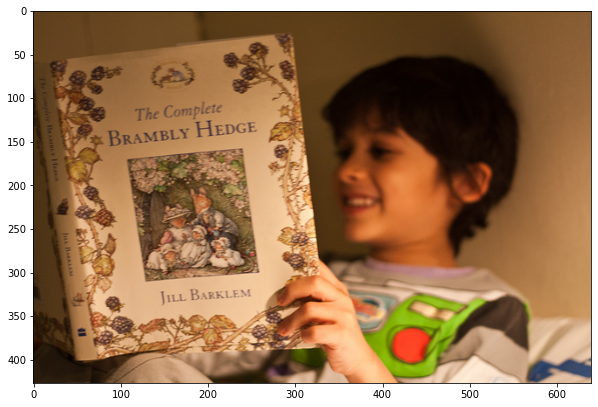

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000438521.jpg


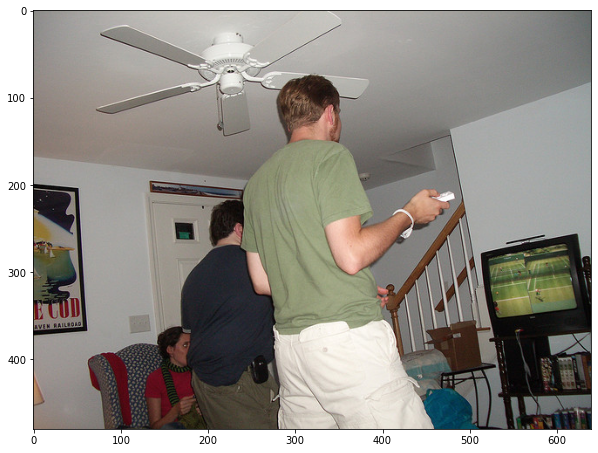


Generated story =
A man is sitting at a book on a book. Two men playing wii in a living room. Is he sitting far teamsome ? '' The men went off to one side of the bookcase door and sat with a baby-ribbon and a skullcap on their backs, rolling their eyes briskly at Harry. One of his cousins came out looking curiously at the rest. `` Harry, '' he said to the baby-ribbon in a whisper, `` what can you be talking about? I saw a man sitting on a book. Where is his bill ? '' The boy kept looking again, and on the third page he found a bill for Harry with a little paper glued inside the square-rigged bill, a note, `` Donate `` at once, '' and four or five words that would have been obtained about anyway except for '' Donate your money ; your money, Harry ! '' Harry looked at it, but pushed his hands through the corner of his look. How he never meant to believe it! Meantime, the rest of the boys took a long breath. `` Harry, '' said a mysterious voice at once. Harry flushed up and stared at the

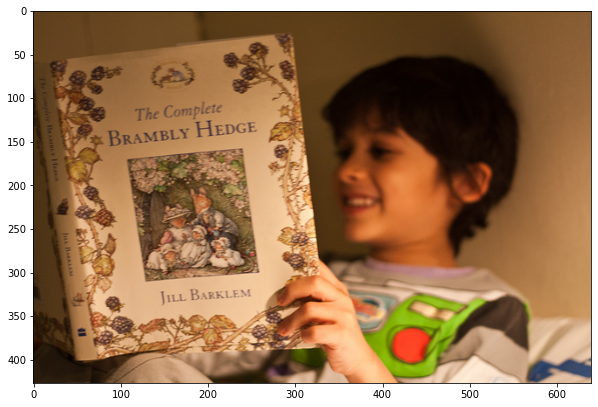

Image 2 = /media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000287296.jpg


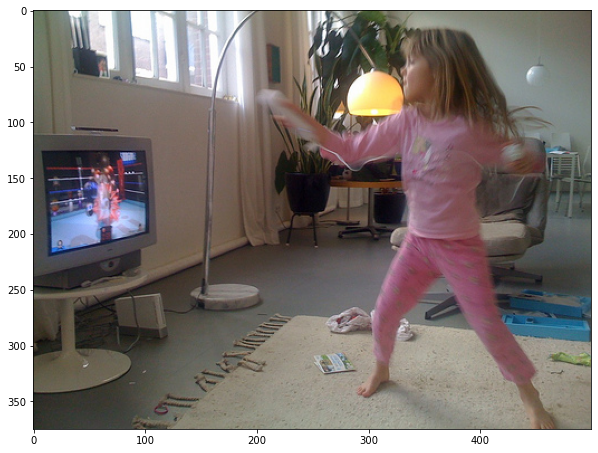


Generated story =
A man is sitting at a book on a book. A man playing a game with a wii remote. Quite innocently I did not see the wii remote. I have always seen it, in its low position about the corner window. It lives at that corner. Way back in its cradle lies Dag-Bak. But constantly -LRB- I am agone I can not talk about it,. --he is in troth now -- he smacks me in the middle of his arms -- When I sat by Dan 's bed I could not help thinking that Dag-Bak 's curiosity had been coursing into his mind, and he wanted me to remember he had old Dag-Bak ; and Dan was laughing in his sleep at the joke. A stranger is in my bed 's darkness. I did not see him then ; but the next moment he stepped out and stood stiff in the middle. A man had rudely '' smacked for some way of winking at me. It made me dizziness and dismay. Now I thought how very resentful Dan would be to ask me to walk over to the ' wii remote when he was away, and let him enjoy the wii remote, because he had not been wiggled ev

In [8]:
cnt_comb_no_attn   = len(comb_no_attn_stories)
cnt_comb_with_attn = len(comb_with_attn_stories)

print(f"\n\n=================== COMBINED NO ATTN STORIES ===================")
print(f"=================== COMBINED NO ATTN STORIES ===================")
print(f"=================== COMBINED NO ATTN STORIES ===================\n")
print(f"\nTotal combined NO ATTN stories = {cnt_comb_no_attn}\n")
for idx1, ele in enumerate(comb_no_attn_stories):
    img_list, sty = ele
    print(f"\n\n************* Story {idx1 + 1} of {cnt_comb_no_attn} *************\n")
    for idx2, img in enumerate(img_list):
        print(f"Image {idx2 + 1} = {img}")
        display_image(img)
    print(f"\nGenerated story =\n{sty}")

print(f"\n\n==================== COMBINED WITH ATTN STORIES ====================")
print(f"==================== COMBINED WITH ATTN STORIES ====================")
print(f"==================== COMBINED WITH ATTN STORIES ====================\n")
print(f"\nTotal combined WITH ATTN  stories = {cnt_comb_with_attn}\n")
for idx1, ele in enumerate(comb_with_attn_stories):
    img_list, sty = ele
    print(f"\n\n************* Story {idx1 + 1} of {cnt_comb_with_attn} *************\n")
    for idx2, img in enumerate(img_list):
        print(f"Image {idx2 + 1} = {img}")
        display_image(img)
    print(f"\nGenerated story =\n{sty}")